# Imports

In [2]:
#Import Packages
import pandas as pd
import numpy as np
import os
import itertools
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import re
import matplotlib.pyplot as plt
from PIL import Image
import datetime
import matplotlib
import matplotlib.dates as mdates
from sklearn.linear_model import LinearRegression
import string
import statsmodels.api as sm
from herbie import Herbie
import pickle
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
import pysolar.solar as solar
from geographiclib.geodesic import Geodesic
import xarray as xr
import pytz
import simplekml
from pylr2 import regress2
import cartopy
import sklearn
import sys
sys.path.append('..')
import funcs.ac_funcs as ac
import funcs.plotting as plotting

pd.options.mode.chained_assignment = None

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Function Definitions

## Plotting

In [15]:
def add_oof_trace(fig,oof_df,spec,color,name,row,errors=False):
    if row ==1:
        showlegend = True
    else:
        showlegend = False
    if errors:
        fig.add_trace(go.Scatter(
            x = oof_df.index,
            y = oof_df[spec],
            name=name,
            error_y = dict(
                type='data', # value of error bar given in data coordinates
                array=oof_df[f'{spec}_error'],
                visible=True,
                color = 'grey',
                width = 0.1),
            mode='markers',
            marker={'color':color,'size':3},
            showlegend = showlegend
        ),row=row,col=1)
    else:
        fig.add_trace(go.Scatter(
            x = oof_df.index,
            y = oof_df[spec],
            name=name,
            mode='markers',
            marker={'color':color,'size':3},
            showlegend=showlegend
        ),row=row,col=1)
        
def add_merged_ts_trace(fig,merged_df,spec,inst_id,row,col=1):
    if inst_id == 'ua':
        color = 'red'
    elif inst_id == 'ha':
        color = 'blue'
    else: 
        raise NameError('inst_id not defined.')
    if row == 1:
        showlegend = True
    else:
        showlegend = False
    fig.add_trace(go.Scatter(
        x = merged_df.index,
        y = merged_df[f'{spec}_{inst_id}'],
        name=inst_id,
        mode='markers',
        marker={'color':color,'size':3},
        showlegend=showlegend
        ),
        row=row,col=col
    )
    if len(spec.split('_'))>1:
        yax_title = f"corr_{spec.split('_')[-1]}"
    else:
        yax_title = spec
    fig.update_yaxes(title_text=yax_title,row=row,col=col)

def add_regression_subplot(fig,merged_df,regressions,spec,row,col):
    def create_annotation(regression):
        #annotation = f"R2={round(regression['lm'].rsquared,2)}<br>slope={round(regression['slope'],3)}<br>y_interc={round(regression['yint'],3)}"
        annotation = f"R2={round(regression['r2'],2)}<br>slope={round(regression['slope'],3)}<br>y_interc={round(regression['yint'],3)}"
        return annotation
    
    regression = regressions[spec]
    fig.add_trace(go.Scatter(
        x = merged_df[f'{spec}_ua'],
        y = merged_df[f'{spec}_ha'],
        mode='markers',
        marker={'color':'black','size':3},
        showlegend = False
    ),row=row,col=col)
    fig.add_trace(go.Scatter(
        x = regression['x_regr_line'],
        y = regression['y_regr_line'],
        mode='lines',
        line={'color':'black'},
        showlegend = False
    ),row=row,col=col)

    fig.update_yaxes(title_text=f'{spec} HA',row=row,col=col)
    fig.update_xaxes(title_text=f'{spec} UA',row=row,col=col)

    fig.add_annotation(
        x=merged_df[f'{spec}_ua'].min(),
        y=merged_df[f'{spec}_ha'].max(),
        text=create_annotation(regression),
        xref='x2',
        yref='y1',
        showarrow=False,
        bordercolor='black',
        font={'size':12},
        xanchor='left',
        yanchor='top',
        align='left',
        row=row,
        col=col
    )

def add_fullrow_to_fig(fig,spec,oof_dfs,row):
    inst_ids = oof_dfs.keys()
    for inst_id in inst_ids:
        if inst_id == 'ua':
            color = 'red'
        elif inst_id == 'ha':
            
            color = 'blue'
        else:
            raise NameError('inst_id not defined')
        add_oof_trace(fig,oof_dfs[inst_id],spec,color,inst_id,row)
    fig.update_yaxes(title_text=spec,row=row,col=1)
    return fig

## Analysis

In [4]:


def merge_oofdfs(oof_dfs,dropna=False):
    inst_ids = oof_dfs.keys()
    dfs_for_merge = {}
    for inst_id in inst_ids:
        df = oof_dfs[inst_id].copy()
        for col in df.columns:
            df = df.rename(columns={col:f'{col}_{inst_id}'})
        dfs_for_merge[inst_id] = df
    merged_df = pd.DataFrame()
    for inst_id in inst_ids:
        merged_df = pd.concat([merged_df,dfs_for_merge[inst_id]],axis = 1)
    if dropna:
        merged_df = merged_df.dropna()
    return merged_df

def read_all_wbb_to_df(wbb_data_path,wbb_resample_interval):
    wbb_met_df = pd.DataFrame()
    for file in os.listdir(wbb_data_path):
        fullpath = os.path.join(wbb_data_path,file)
        df = pd.read_csv(fullpath,header = 6,skiprows=[7])
        df.index = pd.to_datetime(df['Date_Time']).dt.tz_convert(timezone)
        df[['u','v']] = df.apply(lambda row: ac.wdws_to_uv(row['wind_speed_set_1'],row['wind_direction_set_1']),axis = 1,result_type='expand')

        if wbb_resample_interval == None:
            df_resampled = df.copy()
        else:
            df_resampled = df.resample(wbb_resample_interval).mean(numeric_only=True).dropna(how='all')
        df_resampled['ws'],df_resampled['wd'] = np.vectorize(ac.uv_to_wdws)(df_resampled['u'],df_resampled['v'])
        wbb_met_df = pd.concat([wbb_met_df,df_resampled])
    wbb_met_df = wbb_met_df.sort_index()
    wbb_met_df = wbb_met_df.rename(columns={'pressure_set_1':'pressure','air_temp_set_1':'temp'})
    wbb_met_df['pressure'] = wbb_met_df['pressure']/100
    return wbb_met_df

def read_all_trisonica_to_df(trisonica_data_path,trisonica_resample_interval):
    headers_list = ['ET','Date','Time','S','D','U','V','W','T','H','DP','P','AD','PI','RO','MD','TD']
    trisonica_df = pd.DataFrame()
    for file in os.listdir(trisonica_data_path):
        fullpath = os.path.join(trisonica_data_path,file)
        with open(fullpath,'r',errors='ignore') as f:
            rows_list = []
            for i,line in enumerate(f):
                newline = line.strip()
                if len(newline) < 5:
                    continue
                newline = newline.replace('=','')
                for let in string.ascii_letters.replace('n','').replace('a',''):
                    newline = newline.replace(let,'')
                newline = newline.replace(',',' ')
                if newline[0] == ' ':
                    newline = newline[1:]
                newline = re.sub(r"\s+",",",newline)
                line_to_append = newline.split(',')
                if len(line_to_append) == len(headers_list):
                    rows_list.append(line_to_append)
            df = pd.DataFrame(rows_list)
            df.columns = headers_list
            for col in df.columns:
                df[col] = pd.to_numeric(df[col],errors='coerce')
            df = df.dropna(axis = 1,how = 'all')
            df['DT'] = pd.to_datetime(df['ET'],unit='s')
            df = df.set_index('DT')
            df.index = df.index.tz_localize('UTC').tz_convert(timezone)
            df = df.drop(['S','D'],axis = 1)
            if trisonica_resample_interval is not None:
                df = df.resample(trisonica_resample_interval).mean(numeric_only=True)
        trisonica_df = pd.concat([trisonica_df,df])
    trisonica_df = trisonica_df.sort_index()
    trisonica_df['ws'],trisonica_df['wd'] = np.vectorize(ac.uv_to_wdws)(trisonica_df['U'],trisonica_df['V'])
    return trisonica_df

# Side By Side Corrections

In [5]:
#Define parameters
base_project_dir = '/uufs/chpc.utah.edu/common/home/u0890904/LAIR_1/'
data_subfolder = os.path.join(base_project_dir,'Data/EM27_oof/summer_2023/aaron_retrievals')
inst_ids = ['ha','ua']
flag = 0
resample = 'T'
timezone = 'US/Mountain' 
specs = ['xch4(ppm)','xco2(ppm)','xco(ppb)']

### Pre Campaign SBS

Data Load

In [6]:
dt1_str = '2023-07-08 11:00:00'
dt2_str = '2023-07-11 23:59:59' 
dt1 = ac.dtstr_to_dttz(dt1_str,timezone)
dt2 = ac.dtstr_to_dttz(dt2_str,timezone)
my_oof_managers = {}
oof_dfs = {}
for inst_id in inst_ids:
    data_folder = os.path.join(data_subfolder,inst_id)
    my_oof_managers[inst_id] = ac.oof_manager(data_folder,timezone)
    df = my_oof_managers[inst_id].load_oof_df_inrange(dt1,dt2)
    if flag is not None:
        df = df.loc[df['flag']==flag]
    if resample is not None:
        df = df.resample(resample).mean(numeric_only = True)
    oof_dfs[inst_id] = df

merged_df = merge_oofdfs(oof_dfs,dropna=True)

Finding linear regressions for species of interest between instruments

In [20]:
pre_regressions = {}
for spec in specs:
    x = merged_df[f'{spec}_ua']
    y = merged_df[f'{spec}_ha']
    regression = regress2(x,y)
    intercept = regression['intercept']
    slope = regression['slope']
    # x_for_fit = merged_df[f'{spec}_ua'].copy()
    # y_for_fit = merged_df[f'{spec}_ha'].copy()
    # x_for_fit = sm.add_constant(x_for_fit)
    # lm = sm.OLS(y_for_fit,x_for_fit).fit()
    # b = lm.params['const']
    # m = lm.params[f'{spec}_ua']
    # pre_regressions[spec] = dict(
    #     lm = lm,
    #     x_regr_line = x_regr_line,
    #     y_regr_line = y_regr_line,
    #     slope = m,
    #     yint = b
    # )
    x_regr_line = np.linspace(merged_df[f'{spec}_ha'].min(),merged_df[f'{spec}_ha'].max(),100)
    y_regr_line = x_regr_line * slope + intercept 
    pre_regressions[spec] = dict(
        lm = regression,
        x_regr_line = x_regr_line,
        y_regr_line = y_regr_line,
        slope = slope,
        yint = intercept,
        r2 = regression['r']**2
    )



Plot for Visualization

In [21]:
fig = make_subplots(rows = len(specs),cols=2,column_widths=[0.7,0.3])
row = 1
for spec in specs:
    add_merged_ts_trace(fig,merged_df,spec,'ha',row)
    add_merged_ts_trace(fig,merged_df,spec,'ua',row)
    add_regression_subplot(fig,merged_df,pre_regressions,spec,row,2)
    row+=1
fig.update_layout(
    height=500,
    margin = go.layout.Margin(t=1,b=1)
)

Applying regression corrections to the merged dataframe to check adequacy

In [22]:
for spec in specs:
    merged_df[f'pre_corrected_{spec}_ha'] = merged_df[f'{spec}_ha']
    merged_df[f'pre_corrected_{spec}_ua'] = merged_df.apply(lambda row: row[f'{spec}_ua']*pre_regressions[spec]['slope']+pre_regressions[spec]['yint'] ,axis = 1)

Replot the corrected data

In [23]:
plotspecs = ['pre_corrected_'+s for s in specs]
fig = make_subplots(rows = len(plotspecs),cols=1)
row = 1
for plotspec in plotspecs:
    add_merged_ts_trace(fig,merged_df,plotspec,'ha',row)
    add_merged_ts_trace(fig,merged_df,plotspec,'ua',row)
    row+=1

fig.update_layout(
    height=500,
    margin = go.layout.Margin(t=1,b=1)
)

### Post Campaign SBS

Data Load

In [26]:
dt1_str = '2023-08-13 00:00:00'
dt2_str = '2023-08-14 23:59:59' 
dt1 = ac.dtstr_to_dttz(dt1_str,timezone)
dt2 = ac.dtstr_to_dttz(dt2_str,timezone)
my_oof_managers = {}
oof_dfs = {}
for inst_id in inst_ids:
    data_folder = os.path.join(data_subfolder,inst_id)
    my_oof_managers[inst_id] = ac.oof_manager(data_folder,timezone)
    df = my_oof_managers[inst_id].load_oof_df_inrange(dt1,dt2)
    if flag is not None:
        df = df.loc[df['flag']==flag]
    if resample is not None:
        df = df.resample(resample).mean(numeric_only = True)
    oof_dfs[inst_id] = df

merged_df = merge_oofdfs(oof_dfs,dropna=True)

Finding linear regressions for species of interest between instruments

In [27]:
post_regressions = {}
for spec in specs:
    x = merged_df[f'{spec}_ua']
    y = merged_df[f'{spec}_ha']
    regression = regress2(x,y)
    intercept = regression['intercept']
    slope = regression['slope']
    # x_for_fit = merged_df[f'{spec}_ua'].copy()
    # y_for_fit = merged_df[f'{spec}_ha'].copy()
    # x_for_fit = sm.add_constant(x_for_fit)
    # lm = sm.OLS(y_for_fit,x_for_fit).fit()
    # b = lm.params['const']
    # m = lm.params[f'{spec}_ua']
    # pre_regressions[spec] = dict(
    #     lm = lm,
    #     x_regr_line = x_regr_line,
    #     y_regr_line = y_regr_line,
    #     slope = m,
    #     yint = b
    # )
    x_regr_line = np.linspace(merged_df[f'{spec}_ha'].min(),merged_df[f'{spec}_ha'].max(),100)
    y_regr_line = x_regr_line * slope + intercept 
    post_regressions[spec] = dict(
        lm = regression,
        x_regr_line = x_regr_line,
        y_regr_line = y_regr_line,
        slope = slope,
        yint = intercept,
        r2 = regression['r']**2
    )



Plot for Visualization

In [28]:
fig = make_subplots(rows = len(specs),cols=2,column_widths=[0.7,0.3])
row = 1
for spec in specs:
    add_merged_ts_trace(fig,merged_df,spec,'ha',row)
    add_merged_ts_trace(fig,merged_df,spec,'ua',row)
    add_regression_subplot(fig,merged_df,post_regressions,spec,row,2)
    row+=1
fig.update_layout(
    height=500,
    margin = go.layout.Margin(t=1,b=1)
)

Applying regression corrections to the merged dataframe to check adequacy

In [29]:
for spec in specs:
    merged_df[f'post_corrected_{spec}_ha'] = merged_df[f'{spec}_ha']
    merged_df[f'post_corrected_{spec}_ua'] = merged_df.apply(lambda row: row[f'{spec}_ua']*post_regressions[spec]['slope']+post_regressions[spec]['yint'] ,axis = 1)

Replot the corrected data

In [30]:
plotspecs = ['post_corrected_'+s for s in specs]
fig = make_subplots(rows = len(plotspecs),cols=1)
row = 1
for plotspec in plotspecs:
    add_merged_ts_trace(fig,merged_df,plotspec,'ha',row)
    add_merged_ts_trace(fig,merged_df,plotspec,'ua',row)
    row+=1

fig.update_layout(
    height=500,
    margin = go.layout.Margin(t=1,b=1)
)

### Both Pre/Post SBS

Data Load

In [31]:
dt_str_ranges = [{'start':'2023-07-08 11:00:00','end':'2023-07-11 23:59:59'},
                 {'start':'2023-08-13 00:00:00','end':'2023-08-14 23:59:59'}]
my_oof_managers = {}
oof_dfs = {}
for inst_id in inst_ids:
    oof_dfs[inst_id] = pd.DataFrame()
    for dt_str_range in dt_str_ranges:
        dt1 = ac.dtstr_to_dttz(dt_str_range['start'],timezone)
        dt2 = ac.dtstr_to_dttz(dt_str_range['end'],timezone)
        data_folder = os.path.join(data_subfolder,inst_id)
        my_oof_managers[inst_id] = ac.oof_manager(data_folder,timezone)
        df = my_oof_managers[inst_id].load_oof_df_inrange(dt1,dt2)
        if flag is not None:
            df = df.loc[df['flag']==flag]
        if resample is not None:
            df = df.resample(resample).mean(numeric_only = True)
        oof_dfs[inst_id] = pd.concat([oof_dfs[inst_id],df])
merged_df = merge_oofdfs(oof_dfs,dropna=True)

Finding linear regressions for species of interest between instruments

In [32]:
both_regressions = {}
for spec in specs:
    x = merged_df[f'{spec}_ua']
    y = merged_df[f'{spec}_ha']
    regression = regress2(x,y)
    intercept = regression['intercept']
    slope = regression['slope']
    # x_for_fit = merged_df[f'{spec}_ua'].copy()
    # y_for_fit = merged_df[f'{spec}_ha'].copy()
    # x_for_fit = sm.add_constant(x_for_fit)
    # lm = sm.OLS(y_for_fit,x_for_fit).fit()
    # b = lm.params['const']
    # m = lm.params[f'{spec}_ua']
    # pre_regressions[spec] = dict(
    #     lm = lm,
    #     x_regr_line = x_regr_line,
    #     y_regr_line = y_regr_line,
    #     slope = m,
    #     yint = b
    # )
    x_regr_line = np.linspace(merged_df[f'{spec}_ha'].min(),merged_df[f'{spec}_ha'].max(),100)
    y_regr_line = x_regr_line * slope + intercept 
    both_regressions[spec] = dict(
        lm = regression,
        x_regr_line = x_regr_line,
        y_regr_line = y_regr_line,
        slope = slope,
        yint = intercept,
        r2 = regression['r']**2
    )



Plot for Visualization

In [33]:
fig = make_subplots(rows = len(specs),cols=2,column_widths=[0.7,0.3])
row = 1
for spec in specs:
    add_merged_ts_trace(fig,merged_df,spec,'ha',row)
    add_merged_ts_trace(fig,merged_df,spec,'ua',row)
    add_regression_subplot(fig,merged_df,both_regressions,spec,row,2)
    row+=1
fig.update_layout(
    height=500,
    margin = go.layout.Margin(t=1,b=1)
)

Applying regression corrections to the merged dataframe to check adequacy

In [34]:
for spec in specs:
    merged_df[f'both_corrected_{spec}_ha'] = merged_df[f'{spec}_ha']
    merged_df[f'both_corrected_{spec}_ua'] = merged_df.apply(lambda row: row[f'{spec}_ua']*both_regressions[spec]['slope']+both_regressions[spec]['yint'] ,axis = 1)

Replot the corrected data

In [35]:
plotspecs = ['both_corrected_'+s for s in specs]
fig = make_subplots(rows = len(plotspecs),cols=1)
row = 1
for plotspec in plotspecs:
    add_merged_ts_trace(fig,merged_df,plotspec,'ha',row)
    add_merged_ts_trace(fig,merged_df,plotspec,'ua',row)
    row+=1

fig.update_layout(
    height=500,
    margin = go.layout.Margin(t=1,b=1)
)

# Full data load and correct

In [20]:
dt1_str = '2023-07-08 11:00:00'
dt2_str = '2023-08-14 23:59:59' 
timezone = 'US/Mountain' 
resample = '1T'
flag = 0
specs = ['xch4(ppm)','xco2(ppm)','xco(ppb)']
dt1 = ac.dtstr_to_dttz(dt1_str,timezone)
dt2 = ac.dtstr_to_dttz(dt2_str,timezone)
my_oof_managers = {}
oof_dfs = {}
for inst_id in inst_ids:
    data_folder = os.path.join(data_subfolder,inst_id)
    my_oof_managers[inst_id] = ac.oof_manager(data_folder,timezone)
    df = my_oof_managers[inst_id].load_oof_df_inrange(dt1,dt2)
    for spec in specs:
        if inst_id == 'ua':
            df[f'corrected_{spec}'] = df.apply(lambda row: row[spec]*both_regressions[spec]['slope']+both_regressions[spec]['yint'] ,axis = 1)
        else:
            df[f'corrected_{spec}'] = df[spec]
    if flag is not None:
        df = df.loc[df['flag']==flag]
    if resample is not None:
        df = df.resample(resample).mean(numeric_only = True)
    oof_dfs[inst_id] = df.dropna(how='all')

In [21]:
plotspecs = ['corrected_' + s for s in specs]
fig = make_subplots(rows=len(specs),cols=1,shared_xaxes=True,vertical_spacing = 0.05)
i=1
for spec in plotspecs:
    add_fullrow_to_fig(fig,spec,oof_dfs,i)
    i+=1
fig.update_layout(
    height=500,
    margin = go.layout.Margin(t=5,b=5)
)
fig.show()

### Upwind Downwind (UWDW) only

In [22]:
uwdw_dtstr1 = '2023-07-12 00:00:00'
uwdw_dtstr2 = '2023-08-11 23:59:59' 
timezone = 'US/Mountain' 

uwdw_dt1 = ac.dtstr_to_dttz(uwdw_dtstr1,timezone)
uwdw_dt2 = ac.dtstr_to_dttz(uwdw_dtstr2,timezone)
uwdw_dfs = {}
for inst_id in oof_dfs.keys():
    uwdw_dfs[inst_id] = oof_dfs[inst_id].loc[(oof_dfs[inst_id].index>uwdw_dt1)&(oof_dfs[inst_id].index<=uwdw_dt2)]

### Met Data Load

In [23]:
# ws = 8
# wd = 60
# u,v = ac.wdws_to_uv(ws,wd)
# ac.uv_to_wdws(u,v)

wbb_data_path = '/uufs/chpc.utah.edu/common/home/u0890904/LAIR_1/Data/met/wbb/' 
wbb_resample_interval = 'T'
wbb_met_df = read_all_wbb_to_df(wbb_data_path,wbb_resample_interval)
wbb_met_df_mini = wbb_met_df[['pressure','temp','ws','wd','u','v']]

In [37]:
clipped_wbb = wbb_met_df.loc[(wbb_met_df.index>'2023-07-08')&(wbb_met_df.index<'2023-07-15')]
fig = make_subplots(rows = 4, cols = 1,shared_xaxes=True)
fig.add_trace(go.Scatter(
    x = clipped_wbb.index,
    y = clipped_wbb['wind_speed_set_1'],
    mode = 'markers',
    marker = {'size':4}
),row =1,col = 1)
fig.add_trace(go.Scatter(
    x = clipped_wbb.index,
    y = clipped_wbb['wind_direction_set_1'],
    mode = 'markers',
    marker = {'size':4}
),row =2,col = 1)
fig.add_trace(go.Scatter(
    x = clipped_wbb.index,
    y = clipped_wbb['ws'],
    mode = 'markers',
    marker = {'size':4}
),row =3,col = 1)
fig.add_trace(go.Scatter(
    x = clipped_wbb.index,
    y = clipped_wbb['wd'],
    mode = 'markers',
    marker = {'size':4}
),row =4,col = 1)

In [24]:
trisonica_data_path = '/uufs/chpc.utah.edu/common/home/lin-group15/agm/em27/ua/inst_data/met/trisonica_anem/' 
trisonica_resample_interval = 'T'
trisonica_df = read_all_trisonica_to_df(trisonica_data_path,trisonica_resample_interval)
dbk_met_df_mini = trisonica_df[['P','T','ws','wd','U','V']]
dbk_met_df_mini = dbk_met_df_mini.rename(columns={'P':'pressure','T':'temp','U':'u','V':'v'})

ws_thresh_for_wd = 1.0
dbk_met_df_mini['wd'] = dbk_met_df_mini.apply(lambda row: row['wd'] if row['ws']>ws_thresh_for_wd else np.nan,axis = 1)

## Day Examiner

In [25]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap
def add_wind_rows(axes,wbb_met_single,dbk_met_single,markersize,labsize,xlims,windmode):
    if windmode =='scatter':
        axes[3].scatter(wbb_met_single.index,wbb_met_single['ws'],color = 'blue',label='WBB (ha)',s = markersize)
        axes[3].scatter(dbk_met_single.index,dbk_met_single['ws'],color = 'red',label='DBK (ua)',s = markersize)
        axes[3].tick_params(labelsize = labsize)
        axes[3].set_ylabel('ws (m/s)',size = labsize)
        axes[3].set_xlim(xlims)
        axes[3].xaxis.grid(True)
        axes[3].legend(fontsize = labsize *0.8,loc = 'upper right')

        axes[4].scatter(wbb_met_single.index,wbb_met_single['wd'],color = 'blue',label='WBB (ha)',s=markersize)
        axes[4].scatter(dbk_met_single.index,dbk_met_single['wd'],color = 'red',label='DBK (ua)',s=markersize)
        axes[4].set_yticks([0,90,180,270,360])
        axes[4].tick_params(labelsize = labsize)
        axes[4].set_ylabel('wd',size = labsize)
        axes[4].set_xlim(xlims)
        axes[4].set_axisbelow(True)
        axes[4].xaxis.grid(True)
        axes[4].yaxis.grid(True)
    else:

        cmap = matplotlib.colormaps['Blues']
        new_cmap = truncate_colormap(cmap, 0.3, 1)
        axes[3].barbs(wbb_met_single[::windmode].index,5,wbb_met_single['u'][::windmode],wbb_met_single['v'][::windmode],
                      wbb_met_single['ws'][::windmode],cmap = new_cmap,length =6,barb_increments={'half':3,'full':5,'flag':10})
        cmap = matplotlib.colormaps['Reds']
        new_cmap = truncate_colormap(cmap, 0.3, 1)
        axes[3].barbs(dbk_met_single[::windmode].index,-5,dbk_met_single['u'][::windmode],dbk_met_single['v'][::windmode],
                      dbk_met_single['ws'][::windmode],cmap = new_cmap,length = 6,barb_increments={'half':3,'full':5,'flag':10})
        axes[3].tick_params(labelsize = labsize)
        axes[3].set_ylabel('wind barbs',size = labsize)
        axes[3].get_yaxis().set_ticklabels([])
        axes[3].set_xlim(xlims)
        axes[3].set_ylim(-9,9)

    #axes[4].legend(fontsize = labsize *0.8,loc='upper right')
    return axes

def day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line =True,windmode = 'scatter'):
    if windmode =='scatter':
        fig,axes = plt.subplots(5,1,figsize = (15,7.5),height_ratios=[2,2,2,1,1])
    elif type(windmode)==int:
        fig,axes = plt.subplots(4,1,figsize = (15,7.5),height_ratios=[2,2,2,1.5])
    labsize = 12
    markersize = 3
    linewidth = 1

    sub_oof_dfs_rolling = {}
    xlim0_list = []
    xlim1_list = []
    for inst_id in sub_oof_dfs.keys():
        sub_oof_dfs_rolling[inst_id] = sub_oof_dfs[inst_id].rolling(datetime.timedelta(hours=1),center=True).mean()
        xlim0_list.append(sub_oof_dfs[inst_id].index[0])
        xlim1_list.append(sub_oof_dfs[inst_id].index[-1])

    xlims = [min(xlim0_list)-datetime.timedelta(hours=before_hours),max(xlim1_list)+datetime.timedelta(hours=after_hours)]

    species = 'corrected_xch4(ppm)'
    for inst_id in sub_oof_dfs.keys():
        if inst_id == 'ha':
            scatter_color = 'blue' 
            rolling_color = 'royalblue'
        else:
            scatter_color = 'red'
            rolling_color = 'salmon'
        plotdf = sub_oof_dfs[inst_id]
        plotdf_rolling = sub_oof_dfs_rolling[inst_id]
        axes[0].scatter(plotdf.index,plotdf[species],color = scatter_color,zorder=3,label=f'{inst_id} resample {resample}',s=markersize)
        axes[0].errorbar(plotdf.index,plotdf[species],
                        yerr=plotdf[f"{species.split('_')[-1]}_error"],ls='none',
                        ecolor='grey',alpha=0.2)
        if rolling_line:
            axes[0].plot(plotdf_rolling.index,plotdf_rolling[species],color=rolling_color,zorder=4,label=f'{inst_id} 1H rolling mean',linewidth = linewidth)
    axes[0].tick_params(labelsize = labsize)
    axes[0].set_ylabel(species.split('_')[-1],size = labsize)
    axes[0].set_xlim(xlims)
    axes[0].xaxis.grid(True)
    axes[0].legend(fontsize = labsize *0.8,loc = 'upper right')


    species = 'corrected_xco2(ppm)'
    for inst_id in sub_oof_dfs.keys():
        if inst_id == 'ha':
            scatter_color = 'blue' 
            rolling_color = 'royalblue'
        else:
            scatter_color = 'red'
            rolling_color = 'salmon'
        plotdf = sub_oof_dfs[inst_id]
        plotdf_rolling = sub_oof_dfs_rolling[inst_id]
        axes[1].scatter(plotdf.index,plotdf[species],color = scatter_color,zorder=3,label=f'{inst_id} resample {resample}',s = markersize)
        axes[1].errorbar(plotdf.index,plotdf[species],
                        yerr=plotdf[f"{species.split('_')[-1]}_error"],ls='none',
                        ecolor='grey',alpha=0.2)
        if rolling_line:
            axes[1].plot(plotdf_rolling.index,plotdf_rolling[species],color=rolling_color,zorder=4,label=f'{inst_id} 1H rolling mean',linewidth = linewidth)
    axes[1].tick_params(labelsize = labsize)
    axes[1].set_ylabel(species.split('_')[-1],size = labsize)
    axes[1].set_xlim(xlims)
    axes[1].xaxis.grid(True)
    #axes[1].legend(fontsize = labsize *0.8)

    species = 'corrected_xco(ppb)'
    for inst_id in sub_oof_dfs.keys():
        if inst_id == 'ha':
            scatter_color = 'blue' 
            rolling_color = 'royalblue'
        else:
            scatter_color = 'red'
            rolling_color = 'salmon'
        plotdf = sub_oof_dfs[inst_id]
        plotdf_rolling = sub_oof_dfs_rolling[inst_id]
        axes[2].scatter(plotdf.index,plotdf[species],color = scatter_color,zorder=3,label=f'{inst_id} resample {resample}',s = markersize)
        axes[2].errorbar(plotdf.index,plotdf[species],
                        yerr=plotdf[f"{species.split('_')[-1]}_error"],ls='none',
                        ecolor='grey',alpha=0.2)
        if rolling_line:
            axes[2].plot(plotdf_rolling.index,plotdf_rolling[species],color=rolling_color,zorder=4,label=f'{inst_id} 1H rolling mean',linewidth = linewidth)
    axes[2].tick_params(labelsize = labsize)
    axes[2].set_ylabel(species.split('_')[-1],size = labsize)
    axes[2].set_xlim(xlims)
    axes[2].xaxis.grid(True)
    #axes[2].legend(fontsize = labsize *0.8)

    axes = add_wind_rows(axes,wbb_met_single,dbk_met_single,markersize,labsize,xlims,windmode)  

    axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M %Z', tz = timezone))
    axes[-1].set_xlabel(sub_oof_dfs['ha'].index[0].strftime('%b %d, %Y'),size = labsize)

    
    if (sub_oof_dfs['ha'].index[0]<pd.to_datetime('2023-07-12 00:00:00').tz_localize(timezone)) | (sub_oof_dfs['ha'].index[0]>pd.to_datetime('2023-08-12 00:00:00').tz_localize(timezone)):
        title = 'Side By Side WBB' 
    else:
        title = 'Upwind Downwind WBB/DBK'
    axes[0].set_title(title)
    plt.subplots_adjust(hspace=0.1)
    plt.gcf().autofmt_xdate()
    plt.show()

def create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini):
    sub_oof_dfs = {}
    for inst_id in oof_dfs.keys():
        df = oof_dfs[inst_id].copy()
        df = df.loc[df.index.date == date] 
        if len(df) == 0:
            continue
        sub_oof_dfs[inst_id] = df
    wbb_met_single = wbb_met_df_mini.loc[wbb_met_df_mini.index.date == date]
    dbk_met_single = dbk_met_df_mini.loc[dbk_met_df_mini.index.date == date]
    return sub_oof_dfs,wbb_met_single,dbk_met_single

In [26]:
merged_df = merge_oofdfs(oof_dfs)
dates_list = list(pd.Series(merged_df.index.date).unique())

### 2023-07-11

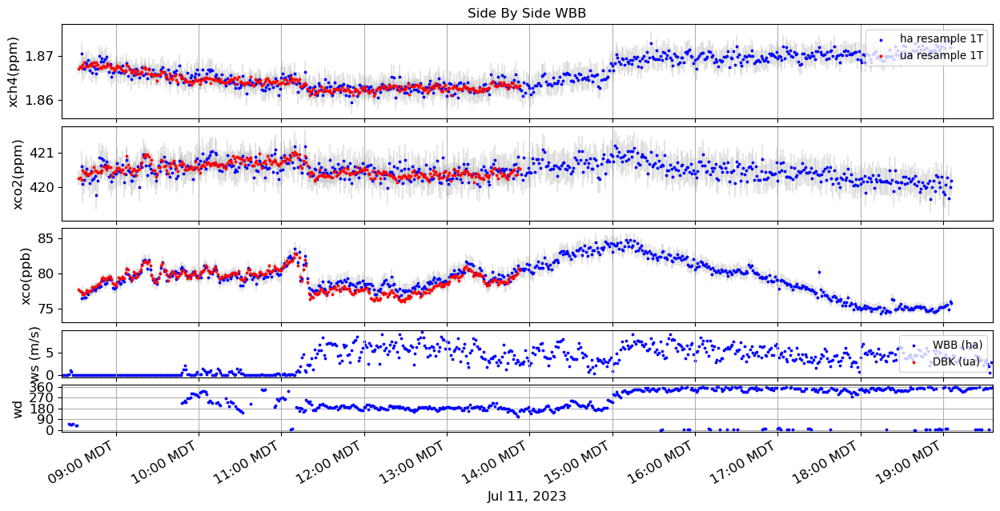

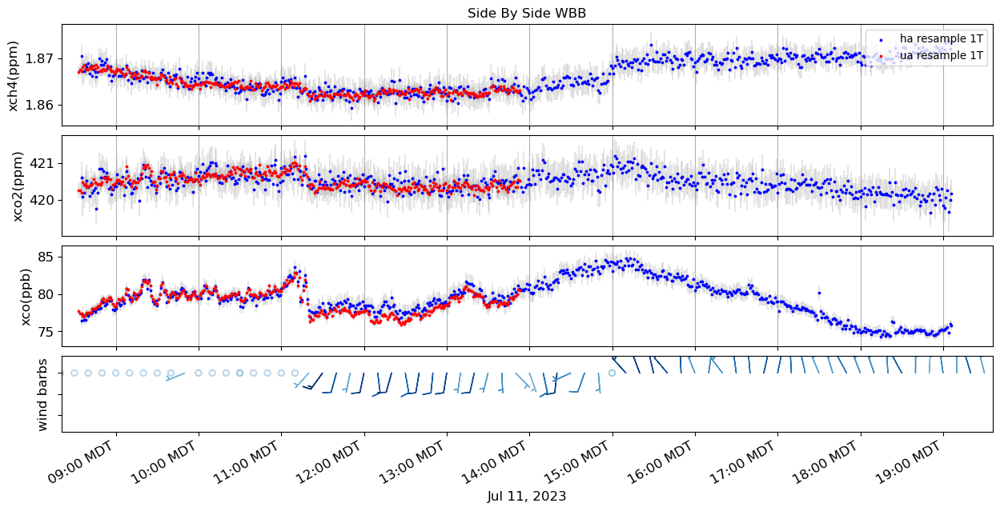

In [27]:
date_idx = 3
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 10)

### 2023-07-12

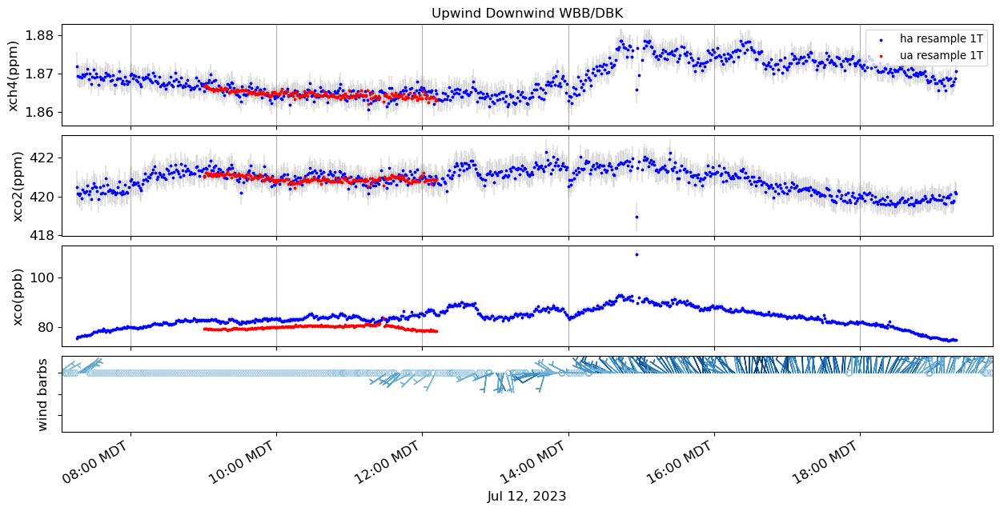

In [28]:
date_idx = 4
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
#day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 2)

### 2023-07-16

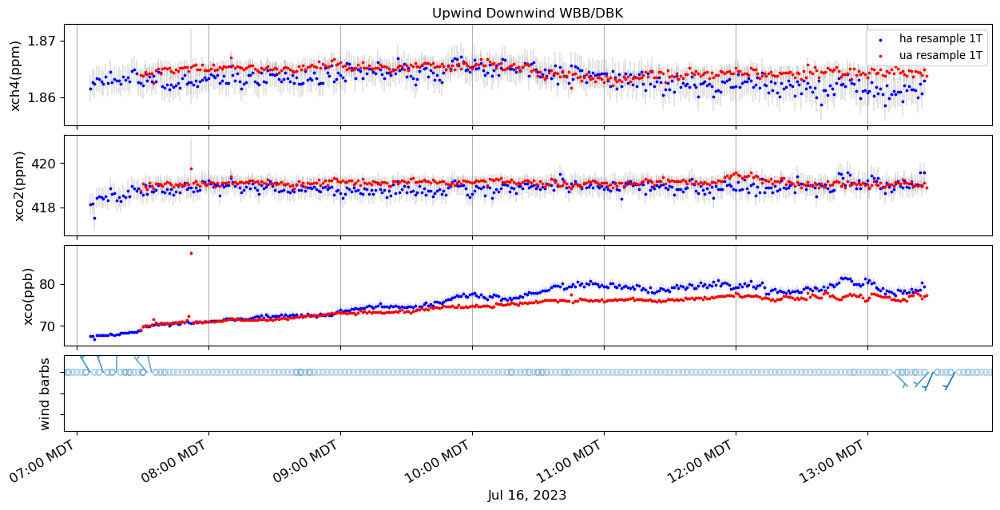

In [29]:
date_idx = 8
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
#day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 2)

### 2023-07-20

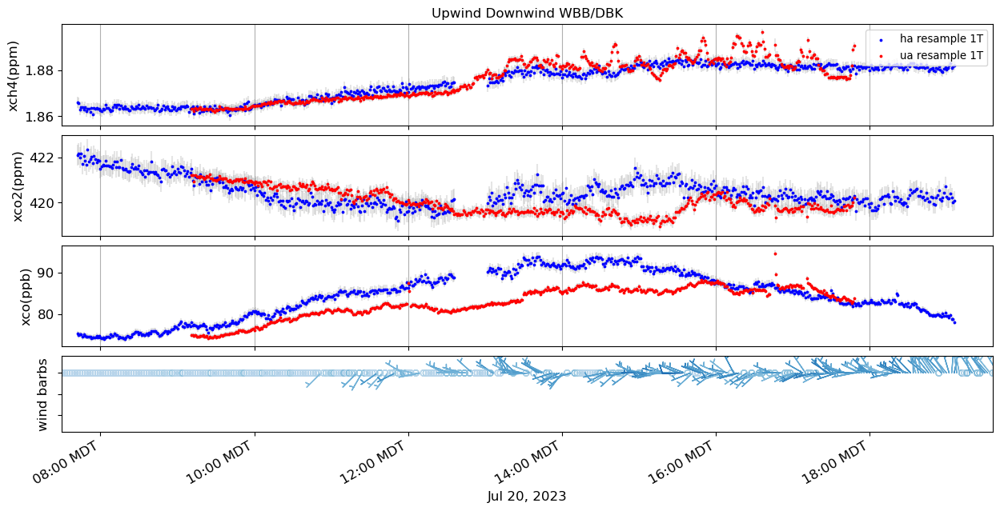

In [30]:
date_idx = 11
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
#day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 2)

### 2023-08-04

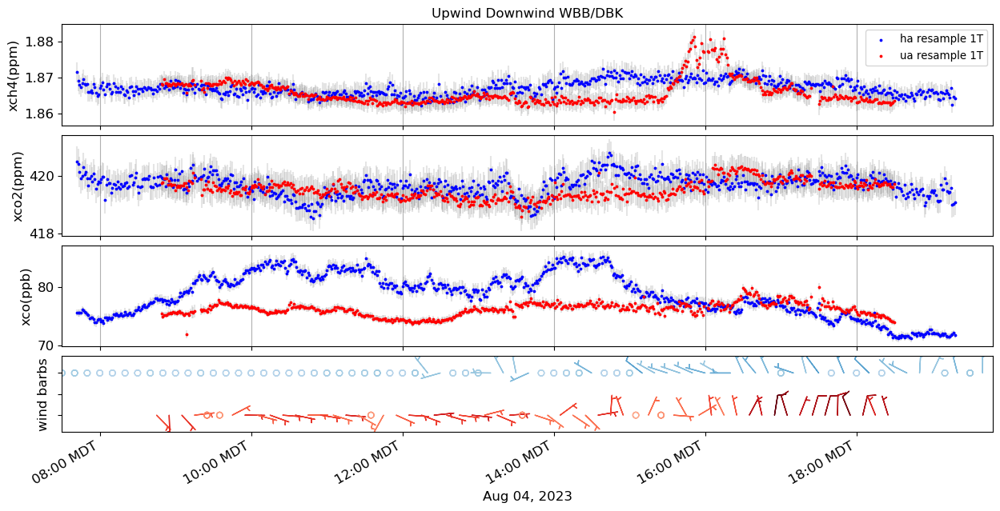

In [38]:
date_idx = 21
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
#day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 10
            )

### 2023-08-05

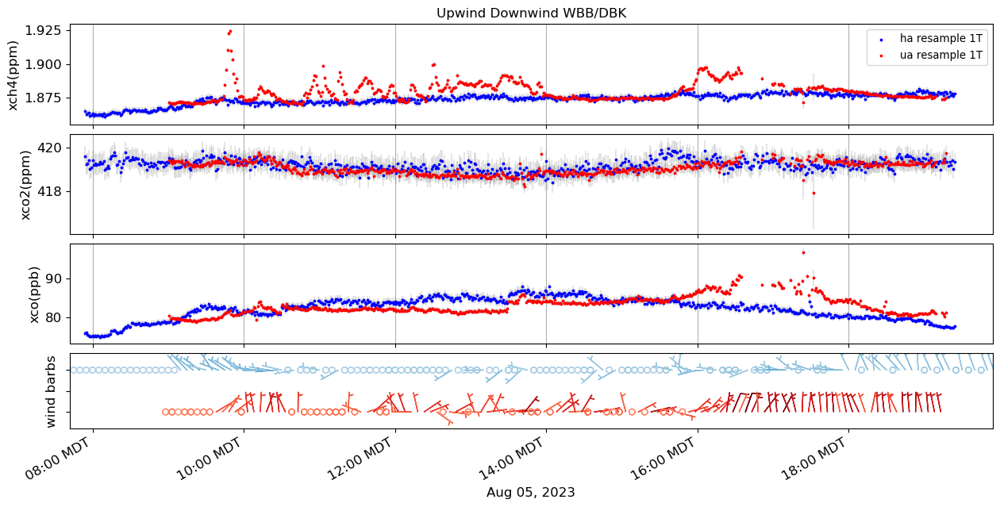

In [32]:
date_idx = 22
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
#day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 5)

In [193]:
ua_df = sub_oof_dfs['ua'].resample('1S').mean()
dbk_met_single_resamp = dbk_met_single.resample('S').mean()

merged_ua_dbk = pd.concat([dbk_met_single_resamp,ua_df],axis = 1)
merged_ua_dbk.index.name = 'dt'
merge_ua_dbk_mini = merged_ua_dbk.dropna()
merge_ua_dbk_mini = merge_ua_dbk_mini[['ws','wd','corrected_xch4(ppm)','corrected_xco2(ppm)','corrected_xco(ppb)']]
merge_ua_dbk_mini = merge_ua_dbk_mini.reset_index()
fname = f"merged_dbk_{date.strftime('%Y%m%d')}.csv"
merge_ua_dbk_mini.to_csv(os.path.join(base_project_dir,'Data/csv_for_r/',fname))

/tmp/ipykernel_3694164/2980983147.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



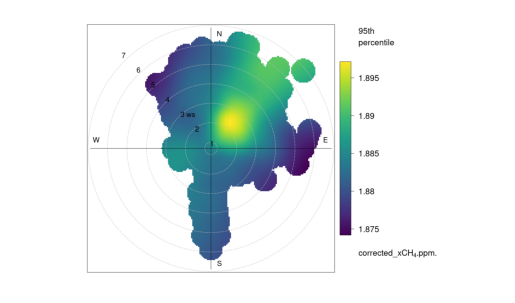

In [33]:
img = Image.open('../../../Figures/polar_plots/20230806_dbk_polar.png')
plt.imshow(img)
plt.axis('off')
plt.show()

### 2023-08-06

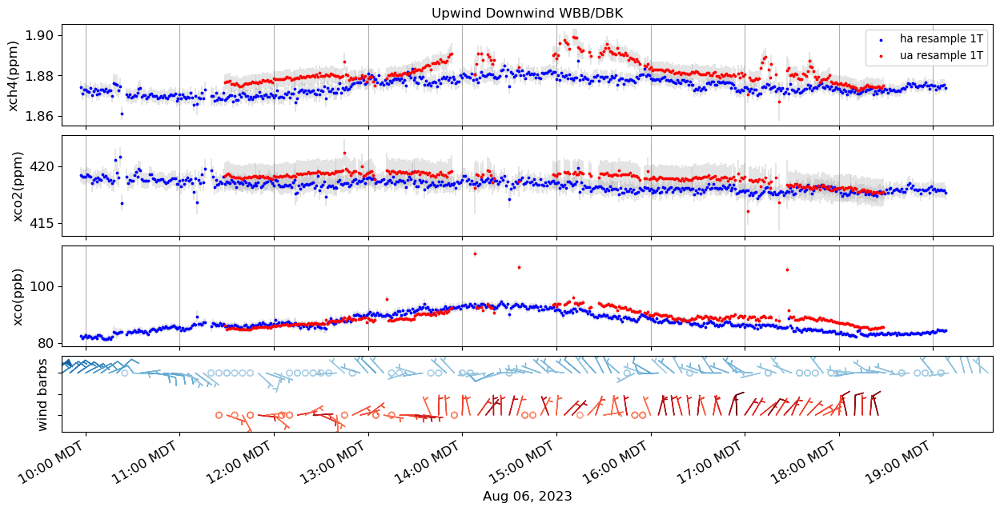

In [39]:
date_idx = 23
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
#day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 5)

### 2023-08-07

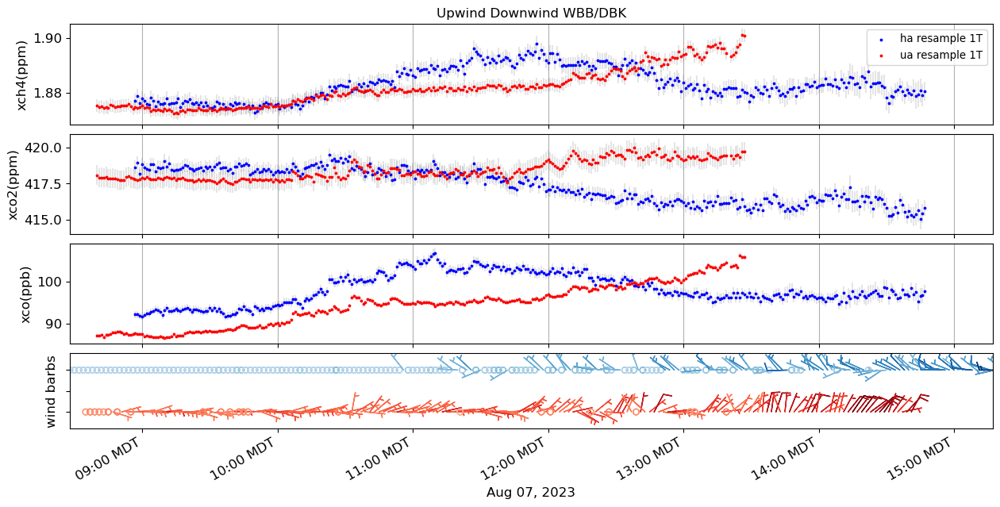

In [35]:
date_idx = 24
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
#day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 2)

### 2023-08-09

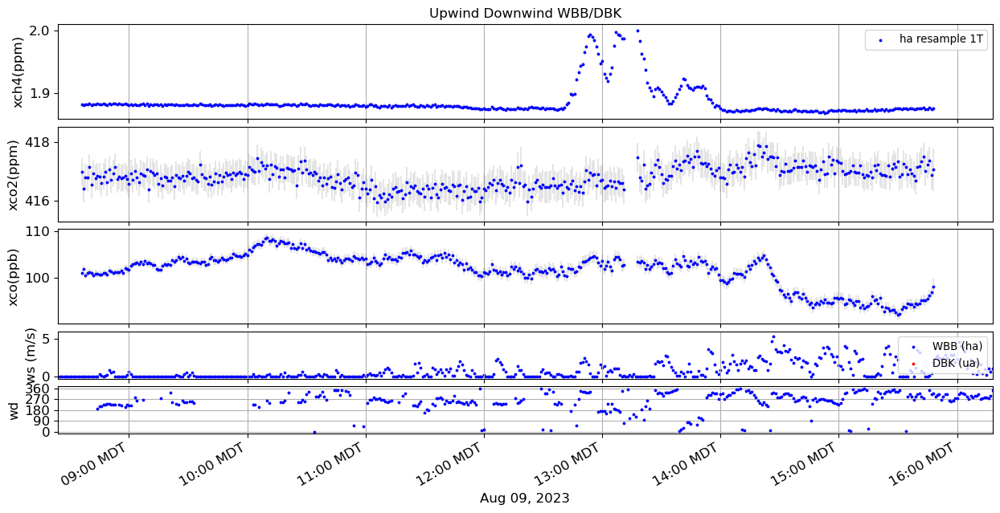

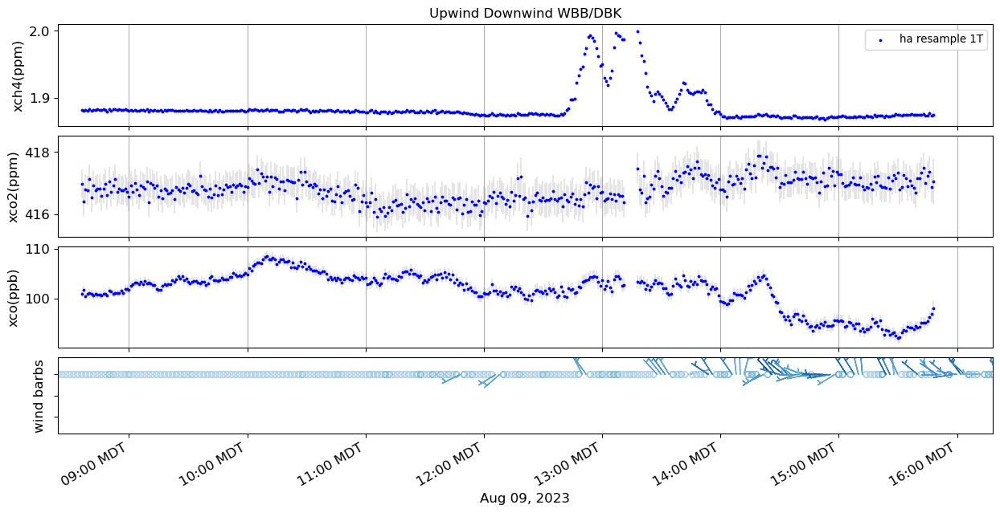

In [36]:
date_idx = 26
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 2)

### 2023-08-14

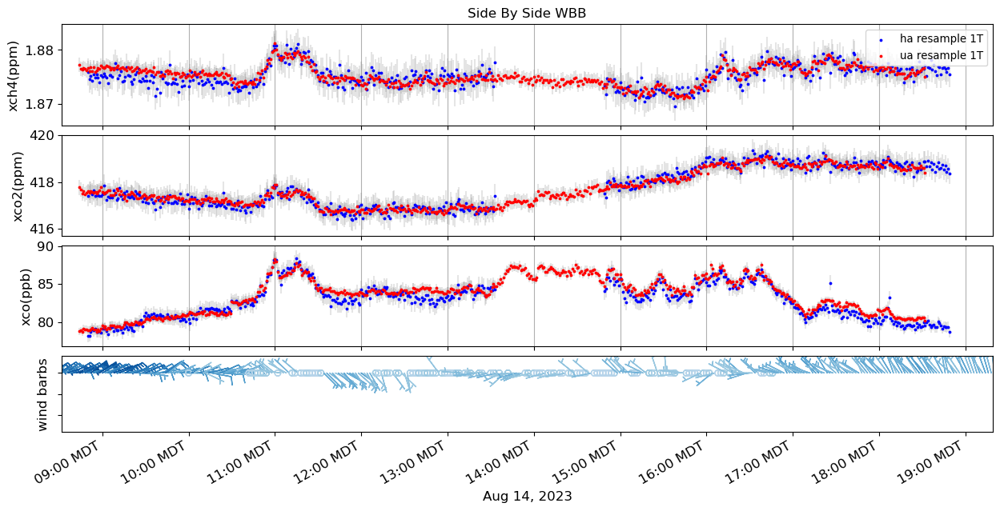

In [37]:
date_idx = 30
before_hours = 0.2
after_hours = 0.5

date = dates_list[date_idx]
sub_oof_dfs,wbb_met_single,dbk_met_single = create_singleday_data(date,oof_dfs,wbb_met_df_mini,dbk_met_df_mini)
#day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 'scatter')
day_plot_mpl(sub_oof_dfs,wbb_met_single,dbk_met_single,before_hours,after_hours,rolling_line = False,windmode = 2)